<a href="https://colab.research.google.com/github/badbloody/diploma2023/blob/main/loadingamodel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [7]:
!pip install torch torchvision -U

  Using cached torch-2.0.1-cp310-cp310-manylinux1_x86_64.whl (619.9 MB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 27.2 MB/s eta 0:00:00


In [2]:
print(torch.__version__)

2.0.1+cu117


In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F

import torchvision
import torchvision.transforms as transforms
import torchvision.models as models

import numpy as np
from collections import defaultdict

#from utils import *

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

class VGG(nn.Module):

    def __init__(self, features):
        super(VGG, self).__init__()
        self.features = features
        self.layer_name_mapping = {
            '3': "relu1_2",
            '8': "relu2_2",
            '15': "relu3_3",
            '22': "relu4_3"
        }
        for p in self.parameters():
            p.requires_grad = False

    def forward(self, x):
        outs = []
        for name, module in self.features._modules.items():
            x = module(x)
            if name in self.layer_name_mapping:
                outs.append(x)
        return outs


class MyConv2D(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1):
        super(MyConv2D, self).__init__()
        self.weight = torch.zeros((out_channels, in_channels, kernel_size, kernel_size)).to(device)
        self.bias = torch.zeros(out_channels).to(device)

        self.in_channels = in_channels
        self.out_channels = out_channels
        self.kernel_size = (kernel_size, kernel_size)
        self.stride = (stride, stride)

    def forward(self, x):
        return F.conv2d(x, self.weight, self.bias, self.stride)

    def extra_repr(self):
        s = ('{in_channels}, {out_channels}, kernel_size={kernel_size}'
             ', stride={stride}')
        return s.format(**self.__dict__)


class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.conv = nn.Sequential(
            *ConvLayer(channels, channels, kernel_size=3, stride=1),
            *ConvLayer(channels, channels, kernel_size=3, stride=1, relu=False)
        )

    def forward(self, x):
        return self.conv(x) + x


def ConvLayer(in_channels, out_channels, kernel_size=3, stride=1,
    upsample=None, instance_norm=True, relu=True, trainable=False):
    layers = []
    if upsample:
        layers.append(nn.Upsample(mode='nearest', scale_factor=upsample))
    layers.append(nn.ReflectionPad2d(kernel_size // 2))
    if trainable:
        layers.append(nn.Conv2d(in_channels, out_channels, kernel_size, stride))
    else:
        layers.append(MyConv2D(in_channels, out_channels, kernel_size, stride))
    if instance_norm:
        layers.append(nn.InstanceNorm2d(out_channels))
    if relu:
        layers.append(nn.ReLU())
    return layers


class TransformNet(nn.Module):
    def __init__(self, base=8):
        super(TransformNet, self).__init__()
        self.base = base
        self.weights = []
        self.downsampling = nn.Sequential(
            *ConvLayer(3, base, kernel_size=9, trainable=True),
            *ConvLayer(base, base*2, kernel_size=3, stride=2),
            *ConvLayer(base*2, base*4, kernel_size=3, stride=2),
        )
        self.residuals = nn.Sequential(*[ResidualBlock(base*4) for i in range(5)])
        self.upsampling = nn.Sequential(
            *ConvLayer(base*4, base*2, kernel_size=3, upsample=2),
            *ConvLayer(base*2, base, kernel_size=3, upsample=2),
            *ConvLayer(base, 3, kernel_size=9, instance_norm=False, relu=False, trainable=True),
        )
        self.get_param_dict()

    def forward(self, X):
        y = self.downsampling(X)
        y = self.residuals(y)
        y = self.upsampling(y)
        return y

    def get_param_dict(self):
        """找出该网络所有 MyConv2D 层，计算它们需要的权值数量"""
        param_dict = defaultdict(int)
        def dfs(module, name):
            for name2, layer in module.named_children():
                dfs(layer, '%s.%s' % (name, name2) if name != '' else name2)
            if module.__class__ == MyConv2D:
                param_dict[name] += int(np.prod(module.weight.shape))
                param_dict[name] += int(np.prod(module.bias.shape))
        dfs(self, '')
        return param_dict

    def set_my_attr(self, name, value):
        # 下面这个循环是一步步遍历类似 residuals.0.conv.1 的字符串，找到相应的权值
        target = self
        for x in name.split('.'):
            if x.isnumeric():
                target = target.__getitem__(int(x))
            else:
                target = getattr(target, x)

        # 设置对应的权值
        n_weight = np.prod(target.weight.shape)
        target.weight = value[:n_weight].view(target.weight.shape)
        target.bias = value[n_weight:].view(target.bias.shape)

    def set_weights(self, weights, i=0):
        """输入权值字典，对该网络所有的 MyConv2D 层设置权值"""
        for name, param in weights.items():
            self.set_my_attr(name, weights[name][i])


class MetaNet(nn.Module):
    def __init__(self, param_dict):
        super(MetaNet, self).__init__()
        self.param_num = len(param_dict)
        self.hidden = nn.Linear(1920, 128*self.param_num)
        self.fc_dict = {}
        for i, (name, params) in enumerate(param_dict.items()):
            self.fc_dict[name] = i
            setattr(self, 'fc{}'.format(i+1), nn.Linear(128, params))

    def forward(self, mean_std_features):
        hidden = F.relu(self.hidden(mean_std_features))
        filters = {}
        for name, i in self.fc_dict.items():
            fc = getattr(self, 'fc{}'.format(i+1))
            filters[name] = fc(hidden[:,i*128:(i+1)*128])
        return filters


In [42]:
print(torch.__version__)

2.0.1+cu118


In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F

import torchvision
import torchvision.transforms as transforms
import torchvision.models as models

import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

cnn_normalization_mean = [0.485, 0.456, 0.406]
cnn_normalization_std = [0.229, 0.224, 0.225]
tensor_normalizer = transforms.Normalize(mean=cnn_normalization_mean, std=cnn_normalization_std)
epsilon = 1e-5


def preprocess_image(image, target_width=None):
    """输入 PIL.Image 对象，输出标准化后的四维 tensor"""
    if target_width:
        t = transforms.Compose([
            transforms.Resize(target_width),
            transforms.CenterCrop(target_width),
            transforms.ToTensor(),
            tensor_normalizer,
        ])
    else:
        t = transforms.Compose([
            transforms.ToTensor(),
            tensor_normalizer,
        ])
    return t(image).unsqueeze(0)


def image_to_tensor(image, target_width=None):
    """输入 OpenCV 图像，范围 0~255，BGR 顺序，输出标准化后的四维 tensor"""
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = Image.fromarray(image)
    return preprocess_image(image, target_width)


def read_image(path, target_width=None):
    """输入图像路径，输出标准化后的四维 tensor"""
    image = Image.open(path)
    return preprocess_image(image, target_width)


def recover_image(tensor):
    """输入 GPU 上的四维 tensor，输出 0~255 范围的三维 numpy 矩阵，RGB 顺序"""
    image = tensor.detach().cpu().numpy()
    image = image * np.array(cnn_normalization_std).reshape((1, 3, 1, 1)) + \
    np.array(cnn_normalization_mean).reshape((1, 3, 1, 1))
    return (image.transpose(0, 2, 3, 1) * 255.).clip(0, 255).astype(np.uint8)[0]


def recover_tensor(tensor):
    m = torch.tensor(cnn_normalization_mean).view(1, 3, 1, 1).to(tensor.device)
    s = torch.tensor(cnn_normalization_std).view(1, 3, 1, 1).to(tensor.device)
    tensor = tensor * s + m
    return tensor.clamp(0, 1)


def imshow(tensor, title=None):
    """输入 GPU 上的四维 tensor，然后绘制该图像"""
    image = recover_image(tensor)
    print(image.shape)
    plt.imshow(image)
    if title is not None:
        plt.title(title)


def mean_std(features):
    """输入 VGG16 计算的四个特征，输出每张特征图的均值和标准差，长度为1920"""
    mean_std_features = []
    for x in features:
        x = x.view(*x.shape[:2], -1)
        x = torch.cat([x.mean(-1), torch.sqrt(x.var(-1) + epsilon)], dim=-1)
        n = x.shape[0]
        x2 = x.view(n, 2, -1).transpose(2, 1).contiguous().view(n, -1) # 【mean, ..., std, ...] to [mean, std, ...]
        mean_std_features.append(x2)
    mean_std_features = torch.cat(mean_std_features, dim=-1)
    return mean_std_features


class Smooth:
    # 对输入的数据进行滑动平均
    def __init__(self, windowsize=100):
        self.window_size = windowsize
        self.data = np.zeros((self.window_size, 1), dtype=np.float32)
        self.index = 0

    def __iadd__(self, x):
        if self.index == 0:
            self.data[:] = x
        self.data[self.index % self.window_size] = x
        self.index += 1
        return self

    def __float__(self):
        return float(self.data.mean())

    def __format__(self, f):
        return self.__float__().__format__(f)

In [3]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [4]:
pip install tensorboardX

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.6/101.6 kB 3.1 MB/s eta 0:00:00


In [3]:
import os

#os.environ['CUDA_VISIBLE_DEVICES'] = '5'

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import torchvision
import torchvision.transforms as transforms
import torchvision.models as models

from tensorboardX import SummaryWriter

import random
import shutil
from glob import glob
from tqdm import tqdm

#from utils import *
#from models import *

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [4]:
vgg16 = models.vgg16(pretrained=True)
vgg16 = VGG(vgg16.features[:23]).to(device).eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [5]:
base = 32
transform_net = TransformNet(base).to(device)
transform_net.get_param_dict()

defaultdict(int,
            {'downsampling.5': 18496,
             'downsampling.9': 73856,
             'residuals.0.conv.1': 147584,
             'residuals.0.conv.5': 147584,
             'residuals.1.conv.1': 147584,
             'residuals.1.conv.5': 147584,
             'residuals.2.conv.1': 147584,
             'residuals.2.conv.5': 147584,
             'residuals.3.conv.1': 147584,
             'residuals.3.conv.5': 147584,
             'residuals.4.conv.1': 147584,
             'residuals.4.conv.5': 147584,
             'upsampling.2': 73792,
             'upsampling.7': 18464})

In [6]:
transform_net

TransformNet(
  (downsampling): Sequential(
    (0): ReflectionPad2d((4, 4, 4, 4))
    (1): Conv2d(3, 32, kernel_size=(9, 9), stride=(1, 1))
    (2): InstanceNorm2d(32, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (3): ReLU()
    (4): ReflectionPad2d((1, 1, 1, 1))
    (5): MyConv2D(32, 64, kernel_size=(3, 3), stride=(2, 2))
    (6): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (7): ReLU()
    (8): ReflectionPad2d((1, 1, 1, 1))
    (9): MyConv2D(64, 128, kernel_size=(3, 3), stride=(2, 2))
    (10): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (11): ReLU()
  )
  (residuals): Sequential(
    (0): ResidualBlock(
      (conv): Sequential(
        (0): ReflectionPad2d((1, 1, 1, 1))
        (1): MyConv2D(128, 128, kernel_size=(3, 3), stride=(1, 1))
        (2): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        (3): ReLU()
        (4): Re

In [7]:
class MetaNet(nn.Module):
    def __init__(self, param_dict):
        super(MetaNet, self).__init__()
        self.param_num = len(param_dict)
        self.hidden = nn.Linear(1920, 128*self.param_num)
        self.fc_dict = {}
        for i, (name, params) in enumerate(param_dict.items()):
            self.fc_dict[name] = i
            setattr(self, 'fc{}'.format(i+1), nn.Linear(128, params))

    # ONNX 要求输出 tensor 或者 list，不能是 dict
    def forward(self, mean_std_features):
        hidden = F.relu(self.hidden(mean_std_features))
        filters = {}
        for name, i in self.fc_dict.items():
            fc = getattr(self, 'fc{}'.format(i+1))
            filters[name] = fc(hidden[:,i*128:(i+1)*128])
        return list(filters.values())

    def forward2(self, mean_std_features):
        hidden = F.relu(self.hidden(mean_std_features))
        filters = {}
        for name, i in self.fc_dict.items():
            fc = getattr(self, 'fc{}'.format(i+1))
            filters[name] = fc(hidden[:,i*128:(i+1)*128])
        return filters

In [8]:
metanet = MetaNet(transform_net.get_param_dict()).to(device)

In [12]:
metanet

MetaNet(
  (hidden): Linear(in_features=1920, out_features=1792, bias=True)
  (fc1): Linear(in_features=128, out_features=18496, bias=True)
  (fc2): Linear(in_features=128, out_features=73856, bias=True)
  (fc3): Linear(in_features=128, out_features=147584, bias=True)
  (fc4): Linear(in_features=128, out_features=147584, bias=True)
  (fc5): Linear(in_features=128, out_features=147584, bias=True)
  (fc6): Linear(in_features=128, out_features=147584, bias=True)
  (fc7): Linear(in_features=128, out_features=147584, bias=True)
  (fc8): Linear(in_features=128, out_features=147584, bias=True)
  (fc9): Linear(in_features=128, out_features=147584, bias=True)
  (fc10): Linear(in_features=128, out_features=147584, bias=True)
  (fc11): Linear(in_features=128, out_features=147584, bias=True)
  (fc12): Linear(in_features=128, out_features=147584, bias=True)
  (fc13): Linear(in_features=128, out_features=73792, bias=True)
  (fc14): Linear(in_features=128, out_features=18464, bias=True)
)

In [9]:
mean_std_features = torch.rand(4, 1920).to(device)
writer = SummaryWriter('runs/metanet')
writer.add_graph(metanet, (mean_std_features, ))

rands = torch.rand(4, 3, 256, 256).to(device)
writer = SummaryWriter('runs/transform_net')
writer.add_graph(transform_net, (rands, ))

/usr/local/lib/python3.10/dist-packages/torch/jit/_trace.py:1056: TracerWarning: Encountering a list at the output of the tracer might cause the trace to be incorrect, this is only valid if the container structure does not change based on the module's inputs. Consider using a constant container instead (e.g. for `list`, use a `tuple` instead. for `dict`, use a `NamedTuple` instead). If you absolutely need this and know the side effects, pass strict=False to trace() to allow this behavior.
  module._c._create_method_from_trace(


In [19]:
pip install horovod

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 16.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for horovod: filename=horovod-0.28.1-cp310-cp310-linux_x86_64.whl size=37734772 sha256=09fc095c4fcd660e88059cf00c4608d073763133429811e62276411034fd6786
  Stored in directory: /root/.cache/pip/wheels/68/48/5f/ebbf9b83e04c68070cf9621e6466c33d698efb747d7920b81f
Successfully built horovod


In [11]:
pip install --no-cache-dir horovod

In [12]:
import horovod.torch as hvd
import torch.utils.data.distributed

from pprint import pprint
display = pprint

hvd.init()
torch.cuda.set_device(hvd.local_rank())

device = torch.device("cuda:%s" %hvd.local_rank() if torch.cuda.is_available() else "cpu")

In [13]:
device

device(type='cuda', index=0)

In [14]:
torch.cuda.device_count()

1

In [38]:
os.environ['CUDA_VISIBLE_DEVICES'] = '1'

In [39]:
torch.cuda.is_available()

True

In [40]:
torch.cuda.device_count()

0

In [15]:
metanet.load_state_dict(torch.load('/content/gdrive/MyDrive/models/metanet_base32_style50_tv1e-06_tagnohvd.pth',map_location='cuda:0'))
transform_net.load_state_dict(torch.load('/content/gdrive/MyDrive/models/metanet_base32_style50_tv1e-06_tagnohvd_transform_net.pth', map_location='cuda:0'))

<All keys matched successfully>

In [16]:
X = torch.rand((1, 3, 256, 256)).to(device)

In [17]:
%%time
for i in range(1000):
    features = vgg16(X)
    mean_std_features = mean_std(features)
    weights = metanet.forward2(mean_std_features)
    transform_net.set_weights(weights)
    del features, mean_std_features, weights

CPU times: user 7.32 s, sys: 3.53 s, total: 10.8 s
Wall time: 11.5 s


In [18]:
%%time
for i in range(1000):
    transform_net(X)

CPU times: user 5.84 s, sys: 1.42 s, total: 7.25 s
Wall time: 7.14 s


In [19]:
%%time
for i in range(1000):
    features = vgg16(X)
    mean_std_features = mean_std(features)
    weights = metanet.forward2(mean_std_features)
    transform_net.set_weights(weights)
    transform_net(X)
    del features, mean_std_features, weights

CPU times: user 14 s, sys: 5.43 s, total: 19.4 s
Wall time: 19.3 s


In [20]:
width = 256

data_transform = transforms.Compose([
    transforms.RandomResizedCrop(width, scale=(256/480, 1), ratio=(1, 1)),
    transforms.ToTensor(),
    tensor_normalizer
])


In [21]:
content_dataset = torchvision.datasets.ImageFolder('/content/gdrive/MyDrive/contentTraining', transform=data_transform)

In [25]:
style_dataset = torchvision.datasets.ImageFolder('/content/gdrive/MyDrive/diplomskiSlike', transform=data_transform)

In [26]:
style_weight = 50
content_weight = 1
tv_weight = 1e-6
batch_size = 8

trainable_params = {}
trainable_param_shapes = {}
for model in [vgg16, transform_net, metanet]:
    for name, param in model.named_parameters():
        if param.requires_grad:
            trainable_params[name] = param
            trainable_param_shapes[name] = param.shape

optimizer = optim.Adam(trainable_params.values(), 1e-3)
content_data_loader = torch.utils.data.DataLoader(content_dataset, batch_size=batch_size, shuffle=True)

In [27]:
style_image = read_image('/content/gdrive/MyDrive/diplomskiSlike/portraits/portrait005.jpg', target_width=256).to(device)
style_features = vgg16(style_image)
style_mean_std = mean_std(style_features)

21it [01:24,  4.04s/it]


(256, 256, 3)
(256, 1024, 3)
(256, 1024, 3)


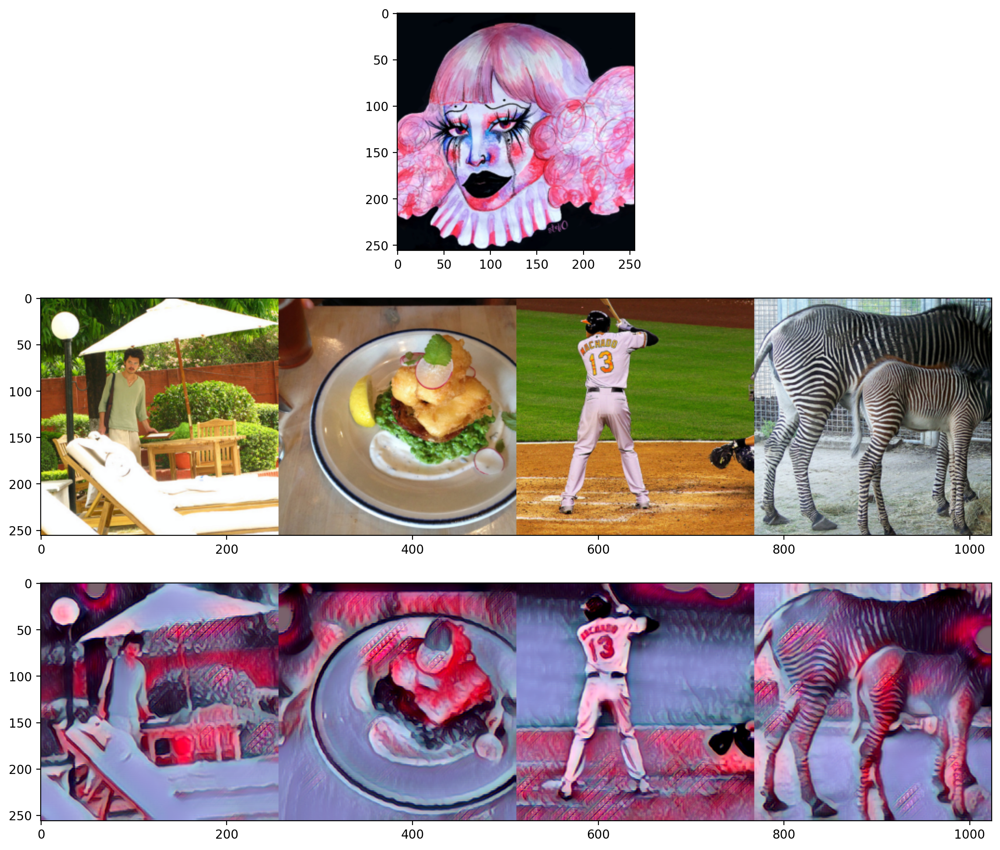

In [28]:
n_batch = 20
with tqdm(enumerate(content_data_loader), total=n_batch) as pbar:
    for batch, (content_images, _) in pbar:
        x = content_images.cpu().numpy()
        if (x.min(-1).min(-1) == x.max(-1).max(-1)).any():
            continue

        optimizer.zero_grad()

        # 使用风格图像生成风格模型
        weights = metanet.forward2(mean_std(style_features))
        transform_net.set_weights(weights, 0)

        # 使用风格模型预测风格迁移图像
        content_images = content_images.to(device)
        transformed_images = transform_net(content_images)

        # 使用 vgg16 计算特征
        content_features = vgg16(content_images)
        transformed_features = vgg16(transformed_images)
        transformed_mean_std = mean_std(transformed_features)

        # content loss
        content_loss = content_weight * F.mse_loss(transformed_features[2], content_features[2])

        # style loss
        style_loss = style_weight * F.mse_loss(transformed_mean_std,
                                               style_mean_std.expand_as(transformed_mean_std))

        # total variation loss
        y = transformed_images
        tv_loss = tv_weight * (torch.sum(torch.abs(y[:, :, :, :-1] - y[:, :, :, 1:])) +
                                torch.sum(torch.abs(y[:, :, :-1, :] - y[:, :, 1:, :])))

        # 求和
        loss = content_loss + style_loss + tv_loss

        loss.backward()
        optimizer.step()

        if batch > n_batch:
            break

content_images = torch.stack([random.choice(content_dataset)[0] for i in range(4)]).to(device)
# while content_images.min() < -2:
#     print('.', end=' ')
#     content_images = torch.stack([random.choice(content_dataset)[0] for i in range(4)]).to(device)
transformed_images = transform_net(content_images)

transformed_images_vis = torch.cat([x for x in transformed_images], dim=-1)
content_images_vis = torch.cat([x for x in content_images], dim=-1)


plt.figure(figsize=(20, 12))
plt.subplot(3, 1, 1)
imshow(style_image)
plt.subplot(3, 1, 2)
imshow(content_images_vis)
plt.subplot(3, 1, 3)
imshow(transformed_images_vis)

(256, 256, 3)
(256, 1024, 3)
(256, 1024, 3)


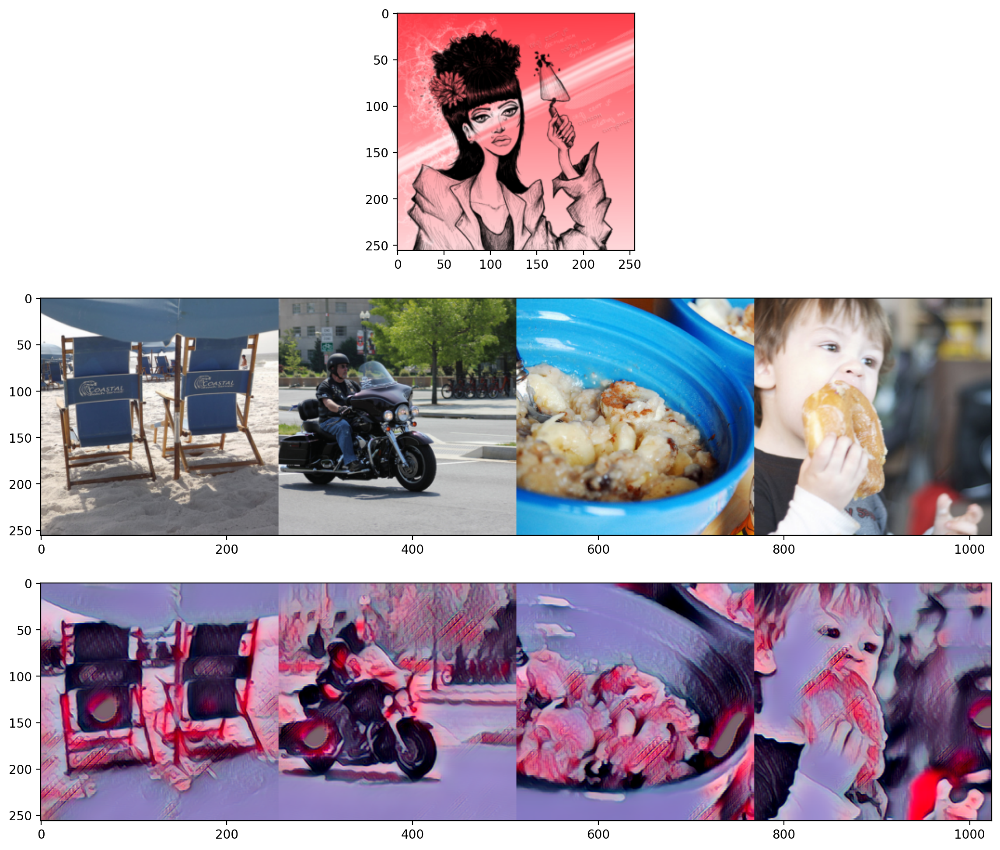

In [29]:
style_image = random.choice(style_dataset)[0].unsqueeze(0).to(device)
#style_image = read_image('../images/mosaic.jpg', target_width=256).to(device)
# style_image = style_image[:,[2, 1, 0]]
features = vgg16(style_image)
mean_std_features = mean_std(features)
weights = metanet.forward2(mean_std_features)
transform_net.set_weights(weights)

content_images = torch.stack([random.choice(content_dataset)[0] for i in range(4)]).to(device)
# while content_images.min() < -2:
#     print('.', end=' ')
#     content_images = torch.stack([random.choice(content_dataset)[0] for i in range(4)]).to(device)
transformed_images = transform_net(content_images)

transformed_images_vis = torch.cat([x for x in transformed_images], dim=-1)
content_images_vis = torch.cat([x for x in content_images], dim=-1)


plt.figure(figsize=(20, 12))
plt.subplot(3, 1, 1)
imshow(style_image)
plt.subplot(3, 1, 2)
imshow(content_images_vis)
plt.subplot(3, 1, 3)
imshow(transformed_images_vis)

(256, 256, 3)
(256, 1024, 3)
(256, 1024, 3)


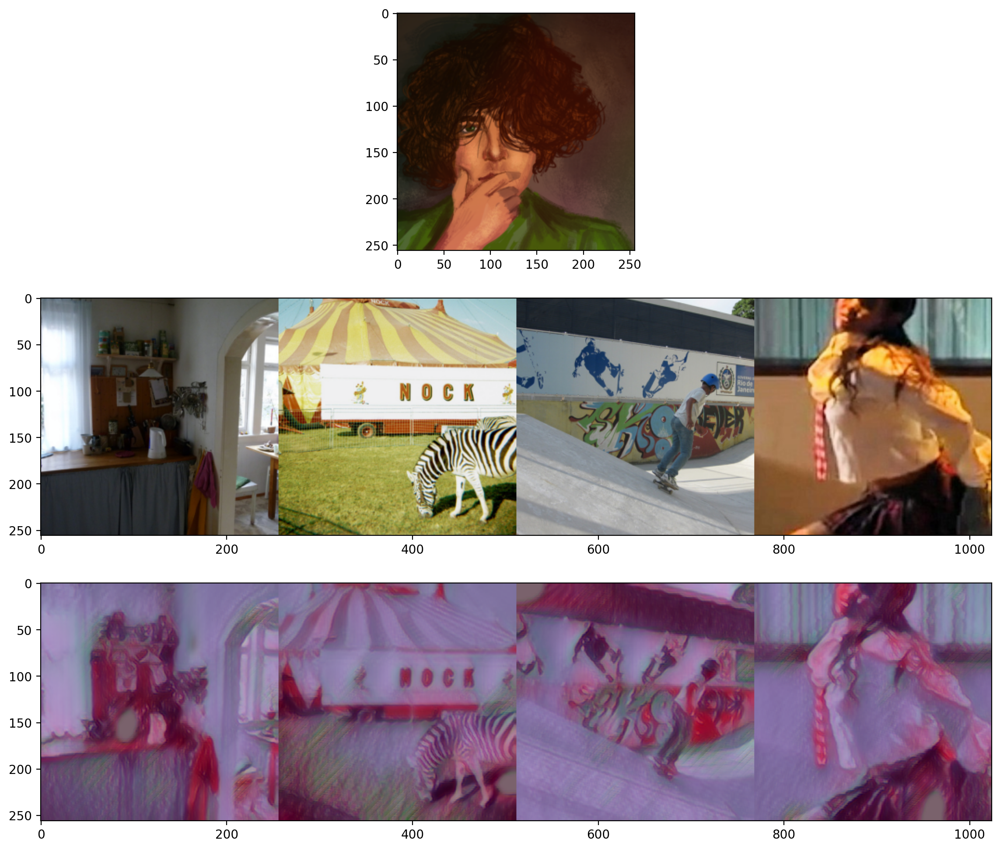

In [30]:
style_image = random.choice(style_dataset)[0].unsqueeze(0).to(device)
#style_image = read_image('../images/mosaic.jpg', target_width=256).to(device)
# style_image = style_image[:,[2, 1, 0]]
features = vgg16(style_image)
mean_std_features = mean_std(features)
weights = metanet.forward2(mean_std_features)
transform_net.set_weights(weights)

content_images = torch.stack([random.choice(content_dataset)[0] for i in range(4)]).to(device)
# while content_images.min() < -2:
#     print('.', end=' ')
#     content_images = torch.stack([random.choice(content_dataset)[0] for i in range(4)]).to(device)
transformed_images = transform_net(content_images)

transformed_images_vis = torch.cat([x for x in transformed_images], dim=-1)
content_images_vis = torch.cat([x for x in content_images], dim=-1)


plt.figure(figsize=(20, 12))
plt.subplot(3, 1, 1)
imshow(style_image)
plt.subplot(3, 1, 2)
imshow(content_images_vis)
plt.subplot(3, 1, 3)
imshow(transformed_images_vis)

In [31]:
style_image = random.choice(style_dataset)[0].unsqueeze(0).to(device)

21it [01:28,  4.19s/it]


(256, 256, 3)
(256, 1024, 3)
(256, 1024, 3)


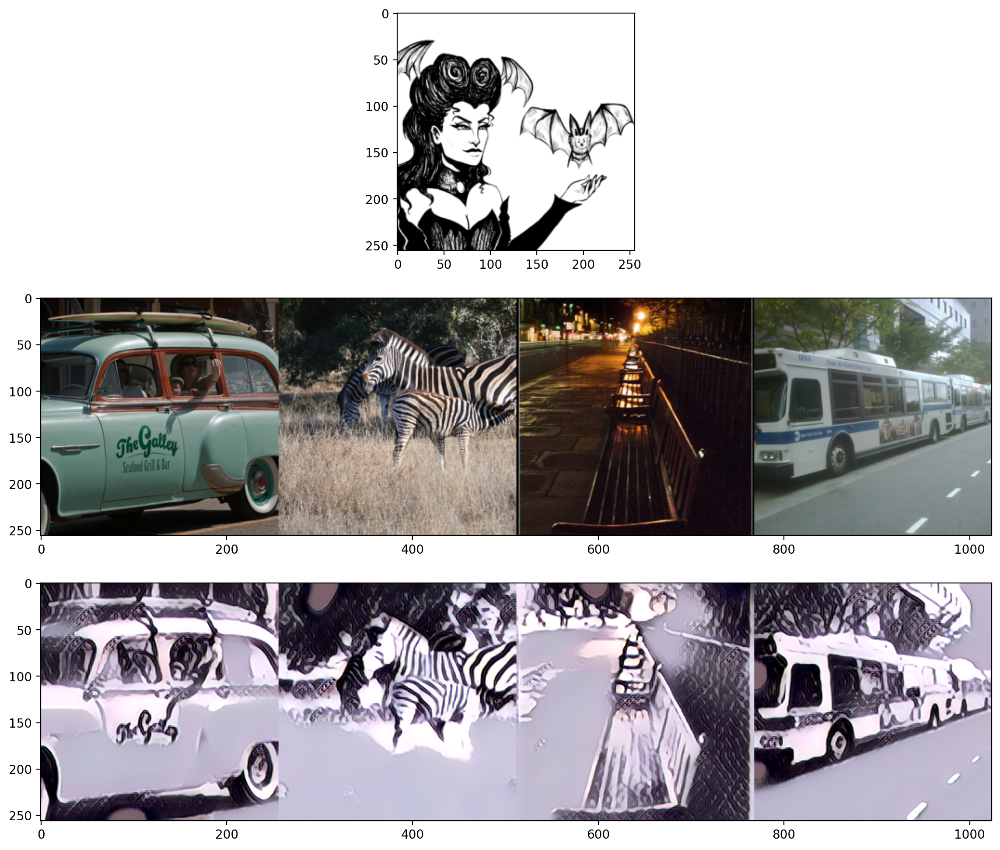

In [32]:
style_features = vgg16(style_image)
style_mean_std = mean_std(style_features)

with tqdm(enumerate(content_data_loader), total=n_batch) as pbar:
    for batch, (content_images, _) in pbar:
        x = content_images.cpu().numpy()
        if (x.min(-1).min(-1) == x.max(-1).max(-1)).any():
            continue

        optimizer.zero_grad()

        # 使用风格图像生成风格模型
        weights = metanet.forward2(mean_std(style_features))
        transform_net.set_weights(weights, 0)

        # 使用风格模型预测风格迁移图像
        content_images = content_images.to(device)
        transformed_images = transform_net(content_images)

        # 使用 vgg16 计算特征
        content_features = vgg16(content_images)
        transformed_features = vgg16(transformed_images)
        transformed_mean_std = mean_std(transformed_features)

        # content loss
        content_loss = content_weight * F.mse_loss(transformed_features[2], content_features[2])

        # style loss
        style_loss = style_weight * F.mse_loss(transformed_mean_std,
                                               style_mean_std.expand_as(transformed_mean_std))

        # total variation loss
        y = transformed_images
        tv_loss = tv_weight * (torch.sum(torch.abs(y[:, :, :, :-1] - y[:, :, :, 1:])) +
                                torch.sum(torch.abs(y[:, :, :-1, :] - y[:, :, 1:, :])))

        # 求和
        loss = content_loss + style_loss + tv_loss

        loss.backward()
        optimizer.step()

        if batch > n_batch:
            break

content_images = torch.stack([random.choice(content_dataset)[0] for i in range(4)]).to(device)
# while content_images.min() < -2:
#     print('.', end=' ')
#     content_images = torch.stack([random.choice(content_dataset)[0] for i in range(4)]).to(device)
transformed_images = transform_net(content_images)

transformed_images_vis = torch.cat([x for x in transformed_images], dim=-1)
content_images_vis = torch.cat([x for x in content_images], dim=-1)


plt.figure(figsize=(20, 12))
plt.subplot(3, 1, 1)
imshow(style_image)
plt.subplot(3, 1, 2)
imshow(content_images_vis)
plt.subplot(3, 1, 3)
imshow(transformed_images_vis)

ABOVE THIS LINE IS WHAT IM WRITING RIGHT NOW

In [ ]:
base = 32
transform_net = TransformNet(base).to(device)
transform_net.get_param_dict()

defaultdict(int,
            {'downsampling.5': 18496,
             'downsampling.9': 73856,
             'residuals.0.conv.1': 147584,
             'residuals.0.conv.5': 147584,
             'residuals.1.conv.1': 147584,
             'residuals.1.conv.5': 147584,
             'residuals.2.conv.1': 147584,
             'residuals.2.conv.5': 147584,
             'residuals.3.conv.1': 147584,
             'residuals.3.conv.5': 147584,
             'residuals.4.conv.1': 147584,
             'residuals.4.conv.5': 147584,
             'upsampling.2': 73792,
             'upsampling.7': 18464})

In [ ]:
transform_net.load_state_dict(torch.load('/content/transform_net_2.pth'))
#transform_net = torch.load('/content/transform_net_2.pth')
transform_net.eval()

AttributeError: ignored

In [ ]:
transform_net.parameters()

total_params = sum(p.numel() for p in transform_net.parameters())
print(total_params)

15587


In [ ]:
metanet = MetaNet(transform_net.get_param_dict()).to(device)

In [ ]:
metanet = torch.load('/content/gdrive/MyDrive/models/metanet_base32_style50_tv1e-06_tagnohvd.pth')


In [ ]:
model = MetaNet(transform_net.get_param_dict()).to(device)
model.load_state_dict(torch.load('/content/gdrive/MyDrive/models/metanet_base32_style50_tv1e-06_tagnohvd.pth'))
model.eval()

MetaNet(
  (hidden): Linear(in_features=1920, out_features=1792, bias=True)
  (fc1): Linear(in_features=128, out_features=18496, bias=True)
  (fc2): Linear(in_features=128, out_features=73856, bias=True)
  (fc3): Linear(in_features=128, out_features=147584, bias=True)
  (fc4): Linear(in_features=128, out_features=147584, bias=True)
  (fc5): Linear(in_features=128, out_features=147584, bias=True)
  (fc6): Linear(in_features=128, out_features=147584, bias=True)
  (fc7): Linear(in_features=128, out_features=147584, bias=True)
  (fc8): Linear(in_features=128, out_features=147584, bias=True)
  (fc9): Linear(in_features=128, out_features=147584, bias=True)
  (fc10): Linear(in_features=128, out_features=147584, bias=True)
  (fc11): Linear(in_features=128, out_features=147584, bias=True)
  (fc12): Linear(in_features=128, out_features=147584, bias=True)
  (fc13): Linear(in_features=128, out_features=73792, bias=True)
  (fc14): Linear(in_features=128, out_features=18464, bias=True)
)

In [ ]:
cnn_normalization_mean = [0.485, 0.456, 0.406]
cnn_normalization_std = [0.229, 0.224, 0.225]
tensor_normalizer = transforms.Normalize(mean=cnn_normalization_mean, std=cnn_normalization_std)

data_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=cnn_normalization_mean, std=cnn_normalization_std)
])

# Load the processed dataset using ImageFolder
content_dataset = torchvision.datasets.ImageFolder(root='/content/gdrive/MyDrive/contentTraining', transform=data_transform)

In [ ]:
content_img = random.choice(content_dataset)[0].unsqueeze(0).to(device)
print(content_img.shape)

torch.Size([1, 3, 256, 256])


In [ ]:
def recover_image(tensor):
    """Input the four-dimensional tensor on the GPU, output the three-dimensional numpy matrix in the range of 0~255, RGB order"""
    image = tensor.detach().cpu().numpy()
    image = image * np.array(cnn_normalization_std).reshape((1, 3, 1, 1)) + \
    np.array(cnn_normalization_mean).reshape((1, 3, 1, 1))
    return (image.transpose(0, 2, 3, 1) * 255.).clip(0, 255).astype(np.uint8)[0]

In [ ]:
def imshow(tensor, title=None):
    """Feed a 4D tensor on the GPU and draw that image"""
    image = recover_image(tensor)
    print(image.shape)
    plt.imshow(image)
    if title is not None:
        plt.title(title)

In [ ]:
model

MetaNet(
  (hidden): Linear(in_features=1920, out_features=1792, bias=True)
  (fc1): Linear(in_features=128, out_features=18496, bias=True)
  (fc2): Linear(in_features=128, out_features=73856, bias=True)
  (fc3): Linear(in_features=128, out_features=147584, bias=True)
  (fc4): Linear(in_features=128, out_features=147584, bias=True)
  (fc5): Linear(in_features=128, out_features=147584, bias=True)
  (fc6): Linear(in_features=128, out_features=147584, bias=True)
  (fc7): Linear(in_features=128, out_features=147584, bias=True)
  (fc8): Linear(in_features=128, out_features=147584, bias=True)
  (fc9): Linear(in_features=128, out_features=147584, bias=True)
  (fc10): Linear(in_features=128, out_features=147584, bias=True)
  (fc11): Linear(in_features=128, out_features=147584, bias=True)
  (fc12): Linear(in_features=128, out_features=147584, bias=True)
  (fc13): Linear(in_features=128, out_features=73792, bias=True)
  (fc14): Linear(in_features=128, out_features=18464, bias=True)
)

(256, 256, 3)
(256, 256, 3)


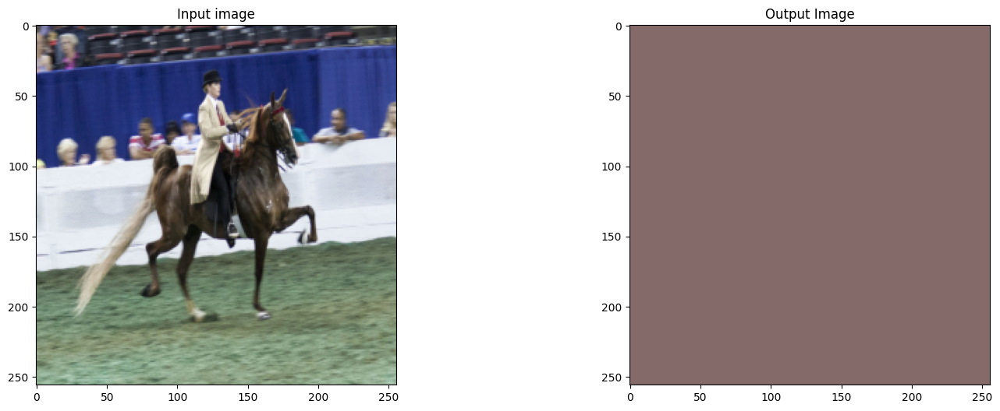

In [ ]:
import random
import matplotlib.pyplot as plt

content_img = random.choice(content_dataset)[0].unsqueeze(0).to(device)
output_img = transform_net(content_img)

plt.figure(figsize=(18, 6))

plt.subplot(1, 2, 1)
imshow(content_img, title='Input image')

plt.subplot(1, 2, 2)
imshow(output_img, title='Output Image')